In [ ]:
%pip install transformers

In [ ]:
%pip install torch torchvision torchaudio

In [43]:
import matplotlib.pyplot as plt

def visualize_prediction(img, output_dict, threshold=0.5, id2label=None):
    keep = output_dict["scores"] > threshold
    boxes = output_dict["boxes"][keep].tolist()
    scores = output_dict["scores"][keep].tolist()
    labels = output_dict["labels"][keep].tolist()

    print(boxes, scores, labels)

    if id2label is not None:
        labels = [id2label[x] for x in labels]


    plt.figure(figsize=(50, 50))
    plt.imshow(img)
    ax = plt.gca()
    
    for score, (xmin, ymin, xmax, ymax), label in zip(scores, boxes, labels):
        if label == 1:
            ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, fill=False, color=[1, 0, 0], linewidth=10))
            ax.text(xmin, ymin, f"{label}: {score:0.2f}", fontsize=60, bbox=dict(facecolor="yellow", alpha=0.8))
    plt.axis("off")
    return plt.show()

In [19]:
def make_prediction(img, feature_extractor, model):
    inputs = feature_extractor(img, return_tensors="pt")
    outputs = model(**inputs)
    img_size = torch.tensor([tuple(reversed(img.size))])
    processed_outputs = feature_extractor.post_process(outputs, img_size)
    return processed_outputs[0]

[[384.1873474121094, 793.169921875, 598.8673095703125, 870.7374877929688], [154.3917236328125, 161.93228149414062, 1312.68310546875, 982.7203979492188]] [0.9996873140335083, 0.9924389123916626] [1, 2]


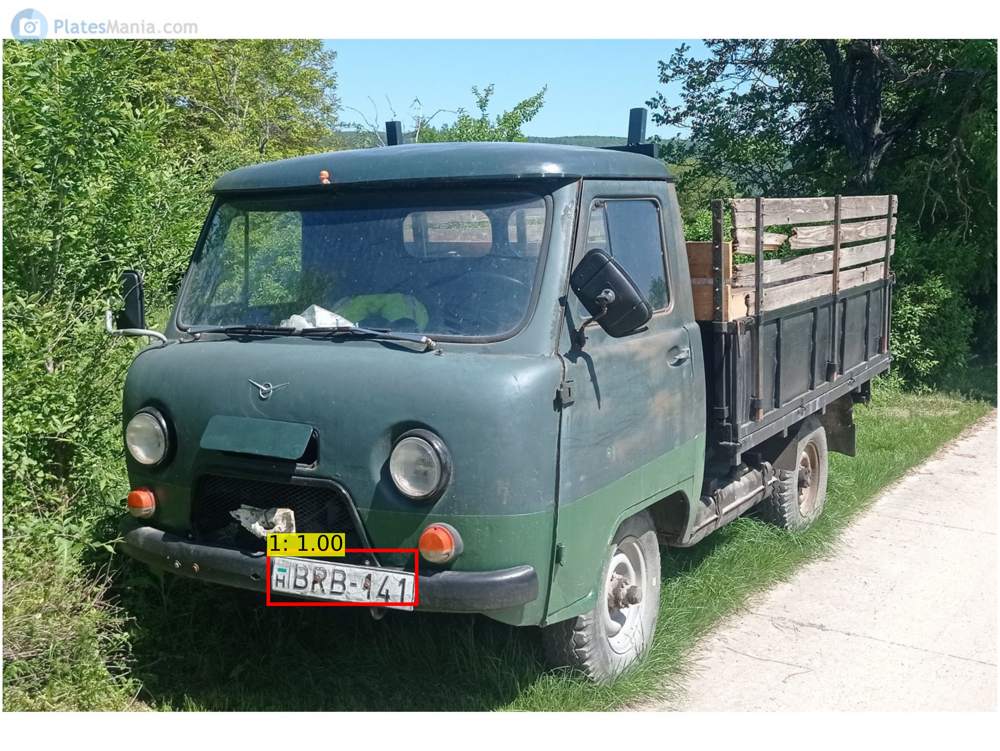

In [47]:
from transformers import YolosForObjectDetection, AutoFeatureExtractor
from PIL import Image
import torch

image = Image.open("./data/images/BRB-141.jpg")

feature_extractor = AutoFeatureExtractor.from_pretrained('nickmuchi/yolos-small-rego-plates-detection')
model = YolosForObjectDetection.from_pretrained('nickmuchi/yolos-small-rego-plates-detection')

processed_outputs = make_prediction(image, feature_extractor, model)

visualize_prediction(image, processed_outputs)
